<h1 style="text-align: center;">Pricing Exotic Options Under Risk Neutrality with Monte Carlo Methods</h1>
<h3 style="text-align: center;">Author: Joao Abrantes</h3>


In [1]:
# Importing Libraries
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import pandas as pd
import scipy as sp
from scipy import *
from scipy.stats import probplot
from tabulate import tabulate


## Random Walks

Brownian motion is a mathematical model used to describe the random movement of asset prices over time (random walks). It's also known as Wiener process after the mathematician Norbert Wiener. Brownian motion is a fundamental concept in the theory of financial markets, particularly in the modeling of stock prices and interest rates.

### 1.1 Definition

A standard Brownian motion or Wiener process is a stochastic process $ W = \{ W_t, t \geq 0 \} $ characterised by the following four properties:

- $W_0 = 0$
- $W_t - W_s \sim N(0, t-s)$ for any $0 \leq s \leq t$
- $W$ has independent increments
- $W$ is almost surely continuous.

### 1.2 Marginal Distributions

Point (2) in the Brownian motion definition implies that for each $t > 0$, the one dimensional marginal distribution $W_t$ is normally distributed with expectation zero, and variance equals $t$, i.e.:

$$
W_t \sim \mathcal{N}(0,t), \qquad \forall t > 0.
$$

### 1.3 Expectation, Variance, and Covariance

Per the equation above, we have:

$$
\mathbf{E} [W_t] = 0, \qquad \forall t \geq 0,
$$

and 

$$
\mathbf{Var} [W_t] = t, \qquad \forall t > 0.
$$

Besides, for any $t>s>0$, we have

$$
\begin{align*}
\mathbf{Cov} [W_t, W_s] &= \mathbf{E} [W_t W_s] \\ 
                        &= \mathbf{E} [(W_t-W_s)W_s + W_s^2] \\
                        &= \mathbf{E} [(W_t-W_s)]\mathbf{E}[W_s] + \mathbf{E}[W_s^2] \\
                        &= s,
\end{align*}
$$

where the second equality follows by simply using the linearity of the expectation and independent increments property. That is

$$
\mathbf{Cov} [W_t, W_s] = \min\{s, t\}, \qquad \forall s, t > 0.
$$

### 1.4 Probability Density Functions

The probability density function (pdf) of the marginal distribution $W_0$ is given by the following expression

$$
f(x, t) = \dfrac{1}{\sqrt{2 \pi t}}\exp\left\{-\dfrac{x^2}{2t}\right\}, \qquad \forall x \in \mathbb{R}, t > 0.
$$

#### 1.4.1 Fokker-Planck Equation

The above pdf satisfies the Fokker-Planck equation

$$
\dfrac{\partial}{\partial t}f(x,t)= \dfrac{1}{2}\dfrac{\partial^2}{\partial x^2}f(x,t).
$$

We clearly see the characteristic symmetric bell-shaped curves of the normal/Gaussian distribution. Moreover, we can make the following observations:

- The Brownian motion will take positive and negative values

- The Brownian motion would take bigger (in magnitude) values as $t$ increases

- The marginal distributions of the Brownian Motion flatten/spread as $t$ increases.

### 1.5 Long Time Behaviour

Almost surely

$$
\lim_{t \rightarrow \infty} \frac{W_t}{t} = 0.
$$

This property is the analogous of the Law of Large Numbers and sometimes is referred as such.

We can visualise this phenomenon by simulating trajectories of the Brownian Motion over a long interval and then simply plottling the values $\frac{W_t}{t}$.

## Geometric Brownian Motion

The underlying stock price is said to follow the Geometric Brownian Motion (GBM):

$$
dS_t = r_t S_t \, dt + \sigma_t S_t \, dW_t
$$

where:
- $ S_t $ is the stock price at time \( t \),
- $ r_t $ is the expected return rate at time \( t \),
- $ \sigma_t $ is the implied volatility at time \( t \),
- $ W_t $ is the Wiener process, representing continuous-time stochastic process
- Under the risk-neutral framework, we assume the asset is going to earn, on average, the risk-free interest rate. 

### 1. Euler-Maruyama Scheme
The Euler-Maruyama scheme is a numerical method for approximating solutions to stochastic differential equations (SDEs). It is a straightforward extension of the Euler method for ordinary differential equations to SDEs. The scheme approximates the drift and diffusion components of the SDE with a linear term and a Gaussian random term, respectively. Given its simplicity, it is less accurate and tends to be more susceptible to numerical errors, especially when dealing with SDEs that have nonlinear terms or large stepsizes.

The Euler-Maruyama scheme formula under the $ \mathbb{Q} $ measure is given by:
$$
S_{t+\delta t} = S_t \left(1 + r \delta t + \sigma \phi \sqrt{\delta t}\right)
$$

where:
- $ \phi $ represents the standard normal distribtuion, N(0,1).

### 2. Milstein Scheme
The Milstein scheme is an improvement over the Euler-Maruyama scheme. It incorporates an additional term to handle the derivative of the diffusion coefficient. This makes the Milstein scheme more accurate than Euler-Maruyama, particularly for SDEs where the diffusion coefficient has significant non-linearities. The Milstein method typically yields better convergence properties and is more stable for a wider range of problems.

The Milstein scheme formula under the $ \mathbb{Q} $ measure is given by:
$$
S_{t+\delta t} = S_t \left(1 + r \delta t + \sigma \phi \sqrt{\delta t} + \sigma^2 (\phi^2 - 1) \delta t \right)
$$

### 3. Closed-Form Solution
Whenever available, the closed-form solution to an SDE is the most accurate. This is because it provides the exact distribution of the process at any future time, assuming the initial conditions and the distribution of the driving stochastic processes (like Brownian motion) are known. In financial modeling, closed-form solutions, when they exist, are derived under the assumption of certain dynamics like the Black-Scholes model for option pricing. These solutions often involve terms like \( \Phi \), the cumulative distribution function of the standard normal distribution, \( N(0,1) \).

The closed form solution is given by:
$$
S_{t+\delta t} = S_t \cdot e^{(r - \frac{1}{2} \sigma^2) \delta t + \sigma \phi \sqrt{\delta t}}
$$

### Arranging these methods by increasing accuracy in terms of simulation fidelity:

- Euler-Maruyama: Least accurate, best for simple or initial approximations.
- Milstein Scheme: More accurate, particularly for equations with significant non-linear diffusion terms.
- Closed-Form Solution: Most accurate, provides exact distributions under the model's assumptions.

Using the Euler-Maruyama scheme only, in this report, the input parameters for the simulation and the option pricing are set as: 

- Stock Price $ S_0 $ = 100, 
- Strike $ E $ = 100, 
- Time to Expiry $ (T − t) $ = 1 year, 
- Stock Volatility $ σ $ = 20%, 
- Risk-Free Rate $ r $ = 5%.

## Testing

Before being used into the exotics option pricing, the stock price simulations need to be tested to ensure their mathematical or statistical properties. The main testings focus on the normal random number generation and martingale property of the underlying stock price.

In [2]:
class StockPriceSimulator:
    def __init__(self, S0, T, ts, r, sigma, N):
        self.S0 = S0  # Initial stock price
        self.T = T    # Total time period
        self.ts = ts  # Number of time steps
        self.r = r    # Risk-free rate
        self.sigma = sigma  # Volatility
        self.N = N    # Number of simulation paths

    def simulate(self):
        np.random.seed(2024)  # Set random seed for reproducibility
        dt = self.T / self.ts  # Define dt
        price_path = np.zeros((self.ts, self.N))
        random_numbers = np.zeros((self.ts - 1, self.N))  # Store random numbers
        price_path[0] = self.S0
        
        for i in range(self.ts - 1):
            w = np.random.standard_normal(self.N)
            random_numbers[i] = w  # Store the generated random numbers
            price_path[i + 1] = price_path[i] * (1 + self.r * dt + self.sigma * np.sqrt(dt) * w)
        
        self.random_numbers = random_numbers  # Make random numbers accessible
        return price_path

    def plot_price_paths(self):
        price_paths = self.simulate()  # Generate the price paths
        plt.figure(figsize=(10, 6))
        time_steps = np.linspace(0, self.T, self.ts)
        for i in range(self.N):
            plt.plot(time_steps, price_paths[:, i], label=f'Path {i + 1}')
        plt.title('Simulated Stock Price Paths')
        plt.xlabel('Time (Years)')
        plt.ylabel('Stock Price')
        plt.legend()
        plt.show()

    def plot_qq(self):
        # Ensure the random numbers have been generated
        if not hasattr(self, 'random_numbers'):
            self.simulate()  # Generate price paths and store random numbers

        # Flatten the array of random numbers to use in the QQ plot
        random_nums_flat = self.random_numbers.flatten()
        plt.figure(figsize=(8, 6))
        probplot(random_nums_flat, dist="norm", plot=plt)
        plt.title('QQ Plot of Random Numbers vs. Standard Normal')
        plt.ylabel('Quantiles of Random Numbers')
        plt.xlabel('Theoretical Quantiles')
        plt.show()

    def plot_discounted_average_price(self):
        price_paths = self.simulate()  # Generate the price paths
        discounted_averages = []
        time_steps = np.linspace(0, self.T, self.ts)
        
        # Calculate discounted average stock price at each time step
        for t in range(self.ts):
            discounted_price = np.exp(-self.r * time_steps[t]) * price_paths[t]
            average_price = np.mean(discounted_price)
            discounted_averages.append(average_price)

        # Plotting the results
        plt.figure(figsize=(10, 6))
        plt.plot(time_steps, discounted_averages, label='Discounted Average Price', marker='o')
        plt.title('Discounted Average Stock Prices Over Time')
        plt.xlabel('Time (Years)')
        plt.ylabel('Discounted Average Price')
        plt.legend()
        plt.grid(True)
        plt.show()


simulator = StockPriceSimulator(S0=100, T=1, ts=252, r=0.05, sigma=0.2, N=10000)


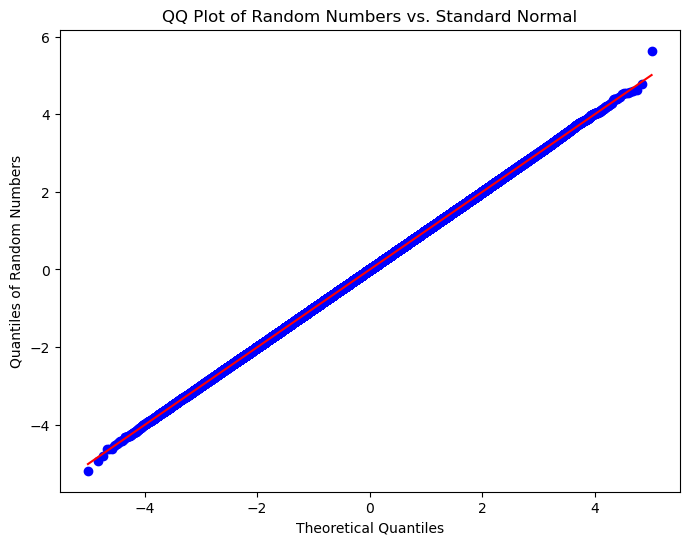

In [3]:
simulator.plot_qq()

The graph testifies the distribution of the random numbers that simulate the Wiener process Wt. The blue mark draws the empirical QQ plot of the random numbers used in the stock price simulation, which is compared to the standard normal distribution QQ plot (red line). The blue labels are within a reasonable range around the red line, which indicates that the random numbers approximately follow the standard normal distribution.

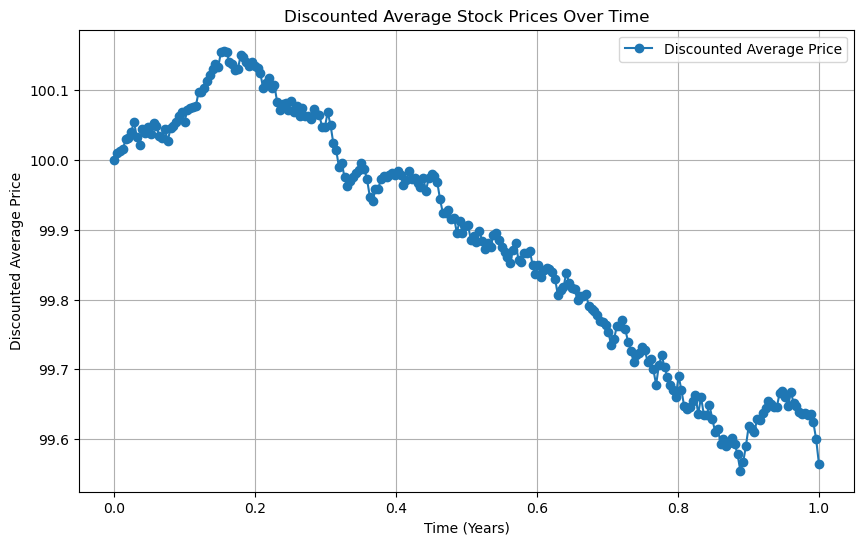

In [4]:
simulator.plot_discounted_average_price()

The graph plots the averaged discounted stock price over each simulation periods. The theoretical base of this testing is the martingale property of the risk neutral pricing, that is

$$
E\left[e^{-\int_0^t r_s \, ds} S_t\right] = S_0
$$

Hence the expected value of the discounted stock price should be $S_0$. The  graph shows that the simulated stock prices are within the range of [99.6, 100.2], which is around $S_0$. The simulations pass the martingale test.

## Asian Options

Asian options are especially popular in the energy over the counter  (OTC) market and many commodity markets. An average is less volatile than the underlying asset itself and will lower the price of 
an average-rate option compared with a similar standard option. If the option is based on an average, an attempt to manipulate the asset price just before expiration will normally have little or no effect on the option's value. Asian options should therefore be of particular interest in markets for thinly traded assets. 

### 1 Payoffs

In general, the expected value of the discounted payoff under the risk-neutral density Q is given by:

$$
V(S(T), T) = \mathbb{E}^\mathbb{Q} \left[ e^{-\int_{T}^{t} r(\tau) \, d\tau} \text{Payoff}(S(T)) \right]
$$

The payoff of the Asian option varies on option type (Call vs. Put), averaging method (Arithmetic vs. Geometric sampling) and strike scheme (Fixed vs. Floating strike). This report mainly discuss the option pricing differences on strike schemes.

#### 1.1 Fixed Asian Call Option

Consider a regular fixed strike Asian call option. The payout of the option at maturity T is determined by the following formula:

$$
C(T) = \max(A(0, T) - K, 0)
$$

where A(0, T) is the averaged underlying price over the period [0, T], and K is the strike price.

#### 1.2 Fixed Asian Put Option

For an Asian put option, the payoff function at maturity T is defined by:

$$
P(T) = \max(K - A(0, T), 0)
$$

#### 1.3 Floating Asian Call Option

In contrast, floating strike options use the final stock price $S_t$ and a multiple of the average price as the strike. 

For the floating strike Asian call option, the payoff is:

$$
C(T) = \max(S(T) - A(0, T), 0)
$$

#### 1.4 Floating Asian Put Option

And for the floating strike Asian put option, the payoff is:

$$
P(T) = \max(kA(0, T) - S(T), 0)
$$

### 2 Averaging Methods

#### 2.1 Arithmetic Averaging Scheme

##### 2.1.1 Continuous Time Average:

In the continuous-time setting, the average A(0, T) is calculated using an integral over the price function:

$$
A(0, T) = \frac{1}{T} \int_0^T S_t \, dt
$$

This represents the mean of the stock price $S_t$ from time 0 to T.

##### 2.1.2 Discrete Time Average:

In a discrete-time setting, the arithmetic average is given by the sum of stock prices at specific intervals divided by the number of intervals:

$$
A(0, T) = \frac{1}{N + 1} \sum_{i=0}^N S(t_i)
$$

where N is the total number of intervals into which the period [0, T] is divided.

#### 2.2 Geometric Averaging Scheme

##### 2.2.1 Continuous Time: 

Under the geometric averaging scheme, the average of the underlying asset price over the period [0, T] in continuous time is given by:

$$
A(0, T) = \exp\left(\frac{1}{T} \int_0^T \ln(S_t) \, dt\right)
$$

This formula calculates the geometric mean of the logarithm of the stock price over the time interval.

##### 2.2.2 Discrete Time:

In discrete time, the geometric average of the stock prices is calculated as follows:

$$
A(0, T) = \left(\prod_{i=0}^{N} S(t_i)\right)^{\frac{1}{N+1}}
$$

The geometric and arithmetic averaging are the same between call and put options.


## Lookback Options

In lookback options, the option's strike is compared to the extreme values (maximum or minimum) observed over the lifetime of the option. This feature makes them particularly attractive in volatile markets where predicting the timing of the highs and lows can be challenging. Fixed strike lookback options allow investors to "look back" at the price history of the underlying asset, ensuring they benefit from the best possible sale or purchase price within the period. A floating-strike lookback call gives the holder of the option the right to buy the underlying security at the lowest price observed, Smin, during the option's lifetime. Similarly, a floating-strike lookback put gives the option holder the right to sell the underlying security at the highest price observed, Smax , during the option's lifetime.

### 1. Payoffs

The option payoffs are dependent on the extreme values, maximum or minimum, of the underlying asset prices over a certain time period (lookback period). There are two standard lookback options: fixed strike and floating strike. Fixed strike lookback option options pay the difference (if positive) between the max ($M_{0}^{T} $) or min ($m_{0}^{T} $) of a set of observations, over a lookback period [0, T] of the asset price Sti and the strike price $K$ at the maturity date $T$.

### 1.1 Fixed Lookback Call Options

For a fixed strike lookback call option, the payoff at maturity $T$ is calculated as the maximum difference, if positive, between the highest price of the asset during the lookback period and the strike price $K$. 

Mathematically, it is expressed as:

$$
C_T = \max(0, M_{0}^{T} - K)
$$

where $ M_{0}^{T}  $ is the maximum of the asset prices over the period [0, T]:

$$
M_{0}^{T} = \max(S_{t_i} : i = 1, \ldots, N)
$$

### 1.2 Fixed Lookback Put Options

For a fixed strike lookback put option, the payoff at maturity $T$ is the maximum difference, if positive, between the strike price $K$ and the lowest price of the asset during the lookback period. 

The formula for the payoff is:

$$
C_T = \max(0, K - m_{0}^{T})
$$

where $ m_{0}^{T} $ is the minimum of the asset prices over the period [0, T]:

$$
m_{0}^{T}  = \min(S_{t_i} : i = 1, \ldots, N)
$$

### 1.3 Floating Lookback Call Options

For a floating strike lookback call option, the payoff at maturity $T$ is calculated as the difference, if positive, between the underlying price $S_T$ and the lowest price of the asset during the lookback period.

Mathematically, it is expressed as:

$$
C_T = \max(0, S_T - m_{0}^{T})
$$

### 1.4 Floating Lookback Put Options

For a floating strike lookback put option, the payoff at maturity $T$ is calculated as the difference, if positive, between highest price of the asset during the lookback period and the underlying price $S_T$.

Mathematically, it is expressed as:

$$
C_T = \max(0, M_{0}^{T} - S_T)
$$

## Option Prices

In [5]:
class MonteCarloOptionPricing:
    '''Monte Carlo Option Pricing Engine'''
    def __init__(self, S0: float, strike: float, rate: float, sigma: float, dte: int, nsim: int, timesteps: int = 252) -> float:
        self.S0 = S0  # Initial stock price
        self.K = strike  # Strike price
        self.r = rate  # Risk-free interest rate
        self.sigma = sigma  # Volatility
        self.T = dte  # Time to expiration in years
        self.N = nsim  # Number of simulations
        self.ts = timesteps  # Time steps
    
    @property
    def pseudorandomnumber(self):
        '''Generate pseudo-random numbers'''
        return np.random.standard_normal(self.N)
    
    @property
    def simulate_path(self):
        '''Simulate price path'''
        np.random.seed(2024)  # Set random seed for reproducibility
        dt = self.T / self.ts  # Define dt
        price_path = np.zeros((self.ts, self.N))
        price_path[0] = self.S0
        for i in range(self.ts - 1):
            w = self.pseudorandomnumber  
            price_path[i + 1] = price_path[i] * (1 + self.r * dt + self.sigma * np.sqrt(dt) * w)
        return price_path
    
    @property
    def vanilla_option(self):
        '''Calculate vanilla option payoff'''
        price_path = self.simulate_path
        vanilla_call = np.exp(-self.r * self.T) * np.mean(np.maximum(0, price_path[-1] - self.K))
        vanilla_put = np.exp(-self.r * self.T) * np.mean(np.maximum(0, self.K - price_path[-1]))
        return [vanilla_call, vanilla_put]
        
    @property
    def asian_option(self):
        '''Calculate asian option payoff'''
        def calculate_asian_option(strike_type):
            price_path = self.simulate_path
            average_price = price_path.mean(axis=0)
            geometric_average_price = np.exp(np.mean(np.log(price_path)))

            if strike_type == "Fixed":
                average_price = price_path.mean(axis=0)
                fixed_asian_call = np.exp(-self.r * self.T) * np.mean(np.maximum(0, average_price - self.K))
                fixed_asian_put = np.exp(-self.r * self.T) * np.mean(np.maximum(0, self.K - average_price))
                return [fixed_asian_call, fixed_asian_put]

            elif strike_type == "Floating":
                average_price = price_path.mean(axis=0)
                floating_asian_call = np.exp(-self.r * self.T) * np.mean(np.maximum(0, price_path[-1] - average_price))
                floating_asian_put = np.exp(-self.r * self.T) * np.mean(np.maximum(0, average_price - price_path[-1]))
                return [floating_asian_call, floating_asian_put]

            else:
                raise ValueError('Incorrect Asian Option type, please select either Fixed or Floating strike.')

        return calculate_asian_option
        
    @property
    def lookback_option(self):
        '''Calculate asian option payoff'''
        def calculate_lookback_option(strike_type):
            price_path = self.simulate_path
            Smax = price_path.max(axis=0)
            Smin = price_path.min(axis=0)
            
            if strike_type == "Fixed":
                fixed_lookback_call = np.exp(-self.r * self.T) * np.mean(np.maximum(0, Smax - self.K))
                fixed_lookback_put = np.exp(-self.r * self.T) * np.mean(np.maximum(0, self.K - Smin))
                return [fixed_lookback_call, fixed_lookback_put]

            elif strike_type == "Floating":
                floating_lookback_call = np.exp(-self.r * self.T) * np.mean(np.maximum(0, price_path[-1] - Smin))
                floating_lookback_put = np.exp(-self.r * self.T) * np.mean(np.maximum(0, Smax - price_path[-1]))
                return [floating_lookback_call, floating_lookback_put]

            else:
                raise ValueError('Incorrect Asian Option type, please select either Fixed or Floating strike.')

        return calculate_lookback_option



In [6]:
# instantiate the Monte Carlo Simulation
mc = MonteCarloOptionPricing(100,100,0.05,0.2,1,10000)

#### Option Value Comparison Table

In [7]:
# Define the print outputs
european_call = mc.vanilla_option[0]
european_put = mc.vanilla_option[1]

asian_call_fixed = mc.asian_option('Fixed')[0]
asian_put_fixed = mc.asian_option('Fixed')[1]

asian_call_floating = mc.asian_option('Floating')[0]
asian_put_floating = mc.asian_option('Floating')[1]

lookback_call_fixed = mc.lookback_option('Fixed')[0]
lookback_put_fixed = mc.lookback_option('Fixed')[1]

lookback_call_floating = mc.lookback_option('Floating')[0]
lookback_put_floating = mc.lookback_option('Floating')[1]

# Create the data for the table
data = [
    ["Vanilla", "European", european_call, european_put],
    ["Asian", "Fixed", asian_call_fixed, asian_put_fixed],
    ["Asian", "Floating", asian_call_floating, asian_put_floating],
    ["Lookback", "Fixed", lookback_call_fixed, lookback_put_fixed],
    ["Lookback", "Floating", lookback_call_floating, lookback_put_floating]
]

# Define the headers for the table
headers = ["Option Type", "Strike Type", "Call Option Value", "Put Option Value"]

# Generate the table using tabulate
table = tabulate(data, headers=headers, floatfmt=".4f")

# Print the table
print(table)

Option Type    Strike Type      Call Option Value    Put Option Value
-------------  -------------  -------------------  ------------------
Vanilla        European                   10.1560              5.7143
Asian          Fixed                       5.6837              3.3811
Asian          Floating                    5.6441              3.5050
Lookback       Fixed                      18.1355             11.8031
Lookback       Floating                   16.2448             13.6939


##### Coments:

- The table above presents the option pricing results using arithmetic averaging methods under the floating strike scheme for Vanilla, Asian and Lookback options
- It appears that the all types of asian options are cheaper than plain vanilla, whereas lookback options are consistently more expensive
- Comparing to the fixed strike scheme pricing, both the asian and the lookback floating strike scheme consistently have lower (higher) call (put) option prices.



##### Option Value w.r.t. Underlying Price

C:\Users\joaor\AppData\Local\Temp\ipykernel_16328\876363582.py:43: RuntimeWarning:

divide by zero encountered in log



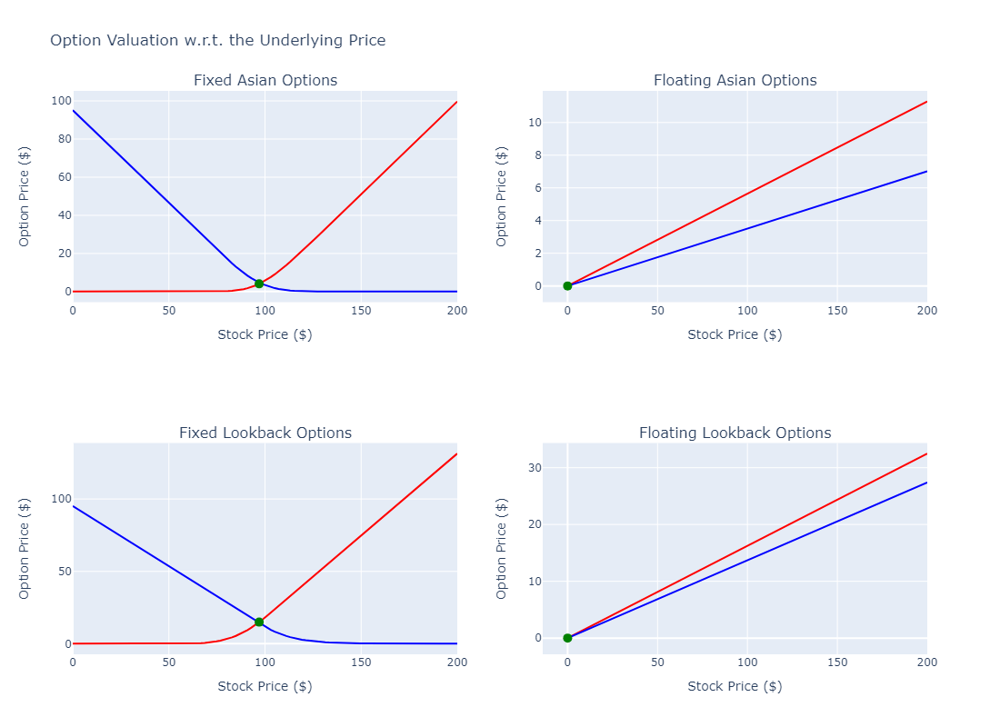

In [8]:
# Define parameters
S = np.linspace(0, 200,100)
S0 = 100
K = 100
nsims = 10000
rate = 0.05
sigma = 0.2
dte = 1

# Setup subplot figure
fig = make_subplots(rows=2, cols=2, subplot_titles=("Fixed Asian Options", "Floating Asian Options", "Fixed Lookback Options", "Floating Lookback Options"))

# Dictionary to map options and types for title and calculation
option_types = {
    (1, 1): ('asian_option', 'Fixed'),
    (1, 2): ('asian_option', 'Floating'),
    (2, 1): ('lookback_option', 'Fixed'),
    (2, 2): ('lookback_option', 'Floating')
}

# Calculate option prices and add traces
for (row, col), (option, strike_type) in option_types.items():
    vals_call = []
    vals_put = []
    for x in S:
        mc = MonteCarloOptionPricing(x, K, rate, sigma, dte, nsims)
        result = mc.__getattribute__(option)(strike_type)
        vals_call.append(result[0])
        vals_put.append(result[1])

    fig.add_trace(go.Scatter(x=S, y=vals_call, mode='lines', name='Call', line=dict(color='red')), row=row, col=col)
    fig.add_trace(go.Scatter(x=S, y=vals_put, mode='lines', name='Put', line=dict(color='blue')), row=row, col=col)

    # Find the index for the minimum difference and add an intercept point
    min_index = np.argmin(np.abs(np.array(vals_call) - np.array(vals_put)))
    intercept = S[min_index]
    fig.add_trace(go.Scatter(x=[intercept], y=[vals_call[min_index]], mode='markers', name='Intercept', marker=dict(color='green', size=10)), row=row, col=col)

# Update layout for the entire figure
fig.update_layout(height=800, width=1200, title_text="Option Valuation w.r.t. the Underlying Price", showlegend=False)
fig.update_xaxes(title_text="Stock Price ($)")
fig.update_yaxes(title_text="Option Price ($)")

# Show plot
fig.show()

##### Comments

- The fixed strike put options (blue) increase in value as $S_T \rightarrow 0$ and vice-versa 
- The fixed call options (red) decrease in value as $S_T \rightarrow 0$ and vice-versa
- Both floating strike options increase in value as $S_T \rightarrow 0$ and vice-versa.

##### Option Value w.r.t. Strike Price

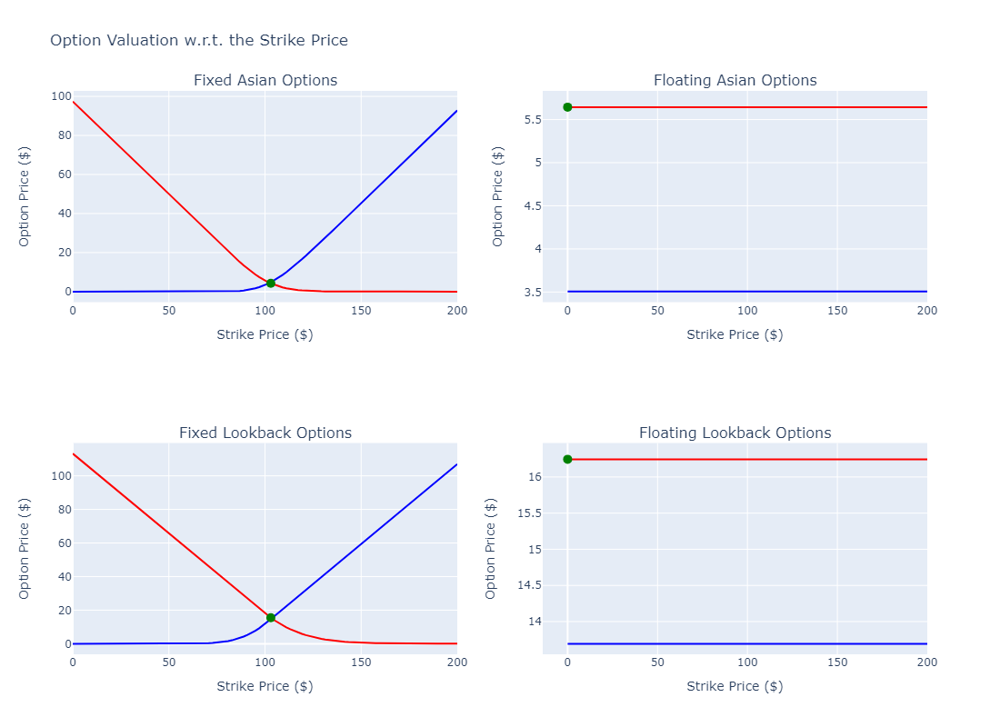

In [9]:
# Define parameters
S = np.linspace(0, 200,100)
S0 = 100
K = 100
nsims = 10000
rate = 0.05
sigma = 0.2
dte = 1

# Setup subplot figure
fig = make_subplots(rows=2, cols=2, subplot_titles=("Fixed Asian Options", "Floating Asian Options", "Fixed Lookback Options", "Floating Lookback Options"))

# Dictionary to map options and types for title and calculation
option_types = {
    (1, 1): ('asian_option', 'Fixed'),
    (1, 2): ('asian_option', 'Floating'),
    (2, 1): ('lookback_option', 'Fixed'),
    (2, 2): ('lookback_option', 'Floating')
}

# Calculate option prices and add traces
for (row, col), (option, strike_type) in option_types.items():
    vals_call = []
    vals_put = []
    for x in S:
        mc = MonteCarloOptionPricing(S0, x, rate, sigma, dte, nsims)
        result = mc.__getattribute__(option)(strike_type)
        vals_call.append(result[0])
        vals_put.append(result[1])

    fig.add_trace(go.Scatter(x=S, y=vals_call, mode='lines', name='Call', line=dict(color='red')), row=row, col=col)
    fig.add_trace(go.Scatter(x=S, y=vals_put, mode='lines', name='Put', line=dict(color='blue')), row=row, col=col)

    # Find the index for the minimum difference and add an intercept point
    min_index = np.argmin(np.abs(np.array(vals_call) - np.array(vals_put)))
    intercept = S[min_index]
    fig.add_trace(go.Scatter(x=[intercept], y=[vals_call[min_index]], mode='markers', name='Intercept', marker=dict(color='green', size=10)), row=row, col=col)

# Update layout for the entire figure
fig.update_layout(height=800, width=1200, title_text="Option Valuation w.r.t. the Strike Price", showlegend=False)
fig.update_xaxes(title_text="Strike Price ($)")
fig.update_yaxes(title_text="Option Price ($)")

# Show plot
fig.show()

##### Comments

- The put options (blue) decrease in value as $K \rightarrow 0$ and vice-versa 
- The call options (red) increase in value as $K \rightarrow 0$ and vice-versa
- For both floating strike options, the change in strike price has no impact in their value as their payoff is independent of such variable. Recall that floating lookback options' strikes are $Smin$ and $Smax$. On the other hand, floating asian options' strikes are the arithemetic and the geometric averages.

##### Option Value w.r.t. Volatility

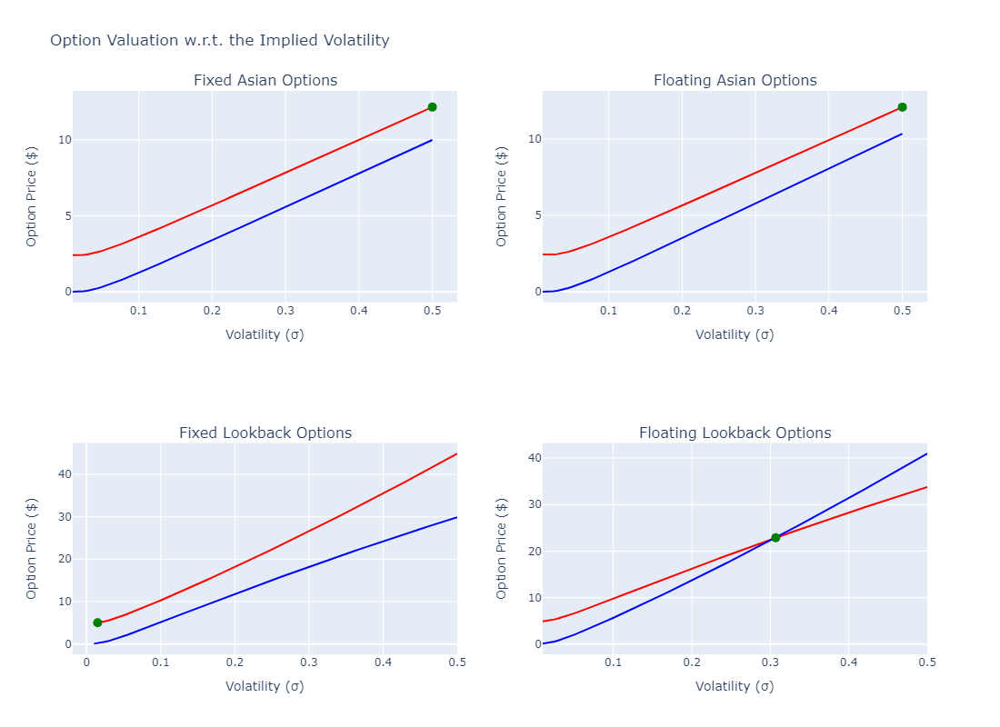

In [10]:
# Define parameters
sigma_range = np.linspace(0.01, 0.5, 100)  # Volatility ranging from 1% to 50%
S0 = 100  # Constant stock price
K = 100
nsims = 10000
rate = 0.05
dte = 1

# Setup subplot figure
fig = make_subplots(rows=2, cols=2, subplot_titles=("Fixed Asian Options", "Floating Asian Options", "Fixed Lookback Options", "Floating Lookback Options"))

# Dictionary to map options and types for title and calculation
option_types = {
    (1, 1): ('asian_option', 'Fixed'),
    (1, 2): ('asian_option', 'Floating'),
    (2, 1): ('lookback_option', 'Fixed'),
    (2, 2): ('lookback_option', 'Floating')
}

# Calculate option prices and add traces
for (row, col), (option, strike_type) in option_types.items():
    vals_call = []
    vals_put = []
    for sigma in sigma_range:
        mc = MonteCarloOptionPricing(S0, K, rate, sigma, dte, nsims)
        result = mc.__getattribute__(option)(strike_type)
        vals_call.append(result[0])
        vals_put.append(result[1])

    fig.add_trace(go.Scatter(x=sigma_range, y=vals_call, mode='lines', name='Call', line=dict(color='red')), row=row, col=col)
    fig.add_trace(go.Scatter(x=sigma_range, y=vals_put, mode='lines', name='Put', line=dict(color='blue')), row=row, col=col)

    # Find the index for the minimum difference and add an intercept point
    min_index = np.argmin(np.abs(np.array(vals_call) - np.array(vals_put)))
    intercept = sigma_range[min_index]
    fig.add_trace(go.Scatter(x=[intercept], y=[vals_call[min_index]], mode='markers', name='Intercept', marker=dict(color='green', size=10)), row=row, col=col)

# Update layout for the entire figure
fig.update_layout(height=800, width=1200, title_text="Option Valuation w.r.t. the Implied Volatility", showlegend=False)
fig.update_xaxes(title_text="Volatility (σ)")
fig.update_yaxes(title_text="Option Price ($)")

# Show plot
fig.show()


##### Comments:

- Both Call (red) and put options (blue) increase in value as $σ \rightarrow \infty$ and vice-versa 
- When volatility is equal to zero the put options are worthless. This is due to the fact that if we substitute the diffusion part in the underlying's brownian motion then the $dW$ term vanishes (i.e. the randomness has been erased), in other words, the asset price follows a fully deterministic dynamic. This dynamic being, under the risk-neutral space, the level risk-free rate.
- For floating strike lookback options only, if volatility reaches a certain level then puts become more expensive than calls, this is because of the implied price range happening with highly volatile assets. As an example, if the underlying trades at $100$ a share but during the lookback period it traded as high as $500$ a share than the payoff is $400$ for the floating lookback put. For the floating lookback call, however, if it traded as low as $20$ a share, than the payoff is only 80$/share. In other words, the floating lookback calls have a floor as to how low the minimum price of the underlying can be (which is zero), whereas floating lookback puts have no cap as to how high the stock price to go.

##### Option Value w.r.t. Risk-Free Rate

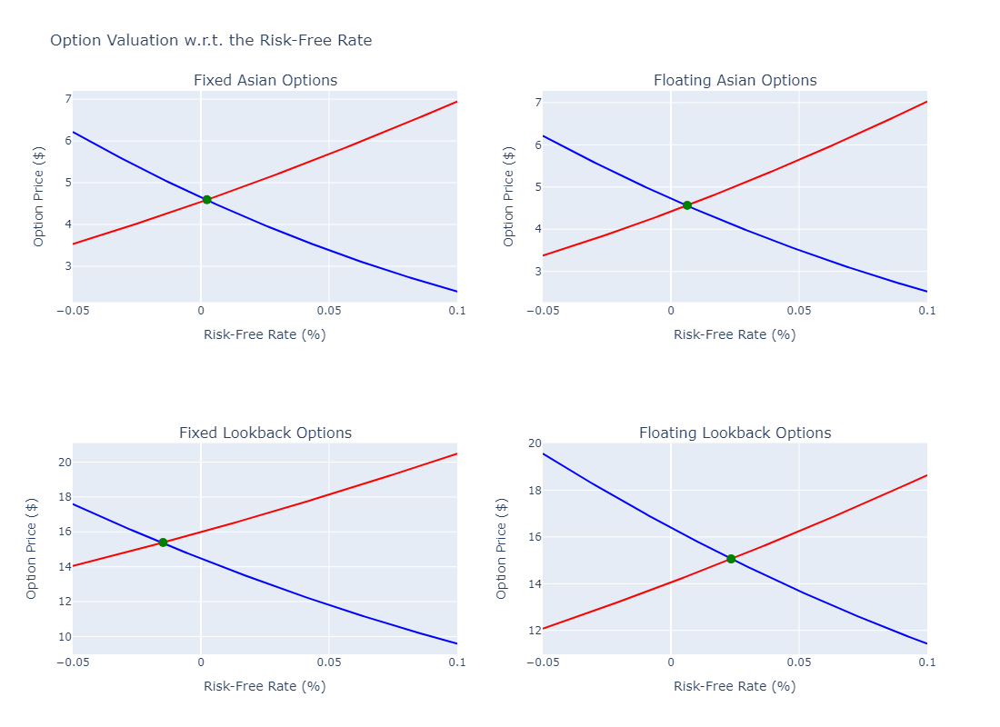

In [11]:
# Define parameters
rate_range = np.linspace(-0.05, 0.1, 150)  # Interest rate ranging from 0% to 10%
S0 = 100  # Constant stock price
K = 100
nsims = 10000
sigma = 0.2  # Constant volatility
dte = 1

# Setup subplot figure
fig = make_subplots(rows=2, cols=2, subplot_titles=("Fixed Asian Options", "Floating Asian Options", "Fixed Lookback Options", "Floating Lookback Options"))

# Dictionary to map options and types for title and calculation
option_types = {
    (1, 1): ('asian_option', 'Fixed'),
    (1, 2): ('asian_option', 'Floating'),
    (2, 1): ('lookback_option', 'Fixed'),
    (2, 2): ('lookback_option', 'Floating')
}

# Calculate option prices and add traces
for (row, col), (option, strike_type) in option_types.items():
    vals_call = []
    vals_put = []
    for rate in rate_range:
        mc = MonteCarloOptionPricing(S0, K, rate, sigma, dte, nsims)
        result = mc.__getattribute__(option)(strike_type)
        vals_call.append(result[0])
        vals_put.append(result[1])

    fig.add_trace(go.Scatter(x=rate_range, y=vals_call, mode='lines', name='Call', line=dict(color='red')), row=row, col=col)
    fig.add_trace(go.Scatter(x=rate_range, y=vals_put, mode='lines', name='Put', line=dict(color='blue')), row=row, col=col)

    # Find the index for the minimum difference and add an intercept point
    min_index = np.argmin(np.abs(np.array(vals_call) - np.array(vals_put)))
    intercept = rate_range[min_index]
    fig.add_trace(go.Scatter(x=[intercept], y=[vals_call[min_index]], mode='markers', name='Intercept', marker=dict(color='green', size=10)), row=row, col=col)

# Update layout for the entire figure
fig.update_layout(height=800, width=1200, title_text="Option Valuation w.r.t. the Risk-Free Rate", showlegend=False)
fig.update_xaxes(title_text="Risk-Free Rate (%)")
fig.update_yaxes(title_text="Option Price ($)")

# Show plot
fig.show()

##### Comments: 

- The put options (blue) increase in value as the $r \rightarrow 0$ and vice-versa 
- The call options (red) decrease in value as $r \rightarrow 0$ and vice-versa
- When $r=0$ the asset price follows a fully random dynamic, where the volatility component, which is non-directional will dominate. Hence, you have almost equally likely scenarios that the underlying asset will be higher or lower than the current level at time $T$.

##### Option Value w.r.t. Days to Expiry

In [9]:
# Define parameters
dte_range = np.linspace(0, 3, 300)  # Dte from a 0DTE option all the way to 3 years expiration
S0 = 100  # Constant stock price
K = 100
nsims = 10000
rate = 0.05  # Constant interest rate
sigma = 0.2  # Constant volatility

# Setup subplot figure
fig = make_subplots(rows=2, cols=2, subplot_titles=("Fixed Asian Options", "Floating Asian Options", "Fixed Lookback Options", "Floating Lookback Options"))

# Dictionary to map options and types for title and calculation
option_types = {
    (1, 1): ('asian_option', 'Fixed'),
    (1, 2): ('asian_option', 'Floating'),
    (2, 1): ('lookback_option', 'Fixed'),
    (2, 2): ('lookback_option', 'Floating')
}

# Calculate option prices and add traces
for (row, col), (option, strike_type) in option_types.items():
    vals_call = []
    vals_put = []
    for dte in dte_range:
        mc = MonteCarloOptionPricing(S0, K, rate, sigma, dte, nsims)
        result = mc.__getattribute__(option)(strike_type)
        vals_call.append(result[0])
        vals_put.append(result[1])

    fig.add_trace(go.Scatter(x=dte_range, y=vals_call, mode='lines', name='Call', line=dict(color='red')), row=row, col=col)
    fig.add_trace(go.Scatter(x=dte_range, y=vals_put, mode='lines', name='Put', line=dict(color='blue')), row=row, col=col)

    # Find the index for the minimum difference and add an intercept point
    min_index = np.argmin(np.abs(np.array(vals_call) - np.array(vals_put)))
    intercept = dte_range[min_index]
    fig.add_trace(go.Scatter(x=[intercept], y=[vals_call[min_index]], mode='markers', name='Intercept', marker=dict(color='green', size=10)), row=row, col=col)

# Update layout for the entire figure
fig.update_layout(height=800, width=1200, title_text="Option Valuation w.r.t. Days to Expiry", showlegend=False)
fig.update_xaxes(title_text="Days to Expiration (#)")
fig.update_yaxes(title_text="Option Price ($)")

# Show plot
fig.show()


##### Comments:

- Both call (red) and put options (blue) increase in value as $(T-t) \rightarrow \infty$ and vice-versa 
- Call options become exponentially more expensive than puts
- The calls and puts cross when days-to-expiry are almost zero
- When $(T-t) \rightarrow 0$ theta decay becomes so large that all option prices become very cheap, as there is not enough time for the underlying to move in such a way where the payoff mechanisms can provide any value.
Put options appear to be capped sooner than calls due to the limiting behaviour of the asset price, in other words, there is only so much the asset price can decrease, therefore the payoff of these options is intrinsically limited. 

##### Option Value w.r.t. Underlying Price and Implied Volatility

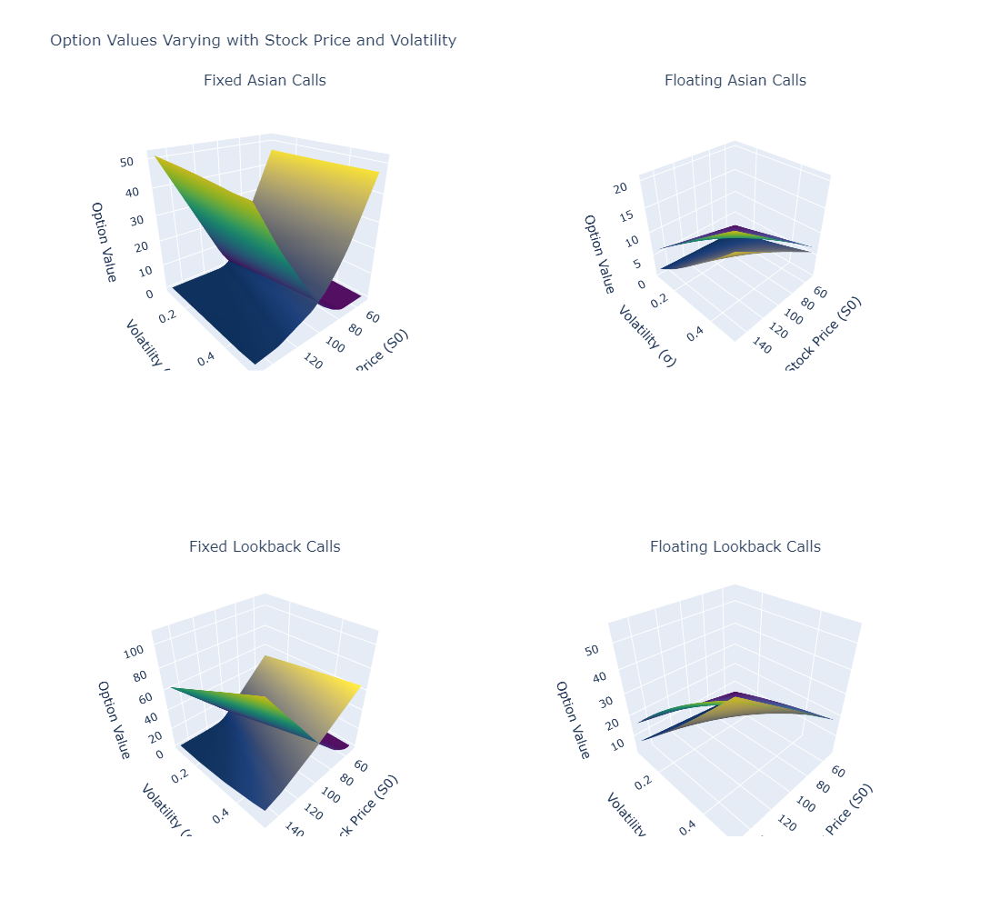

In [12]:
# Define ranges for S0 and sigma
S0_range = np.linspace(50, 150, 50)  # Initial stock prices from $50 to $150
sigma_range = np.linspace(0.1, 0.5, 50)  # Volatility from 10% to 50%

# Create a grid of S0 and sigma values
S0_grid, sigma_grid = np.meshgrid(S0_range, sigma_range)

# Constant parameters
nsims = 10
rate = 0.05
dte = 1  # Days to expiration

# Initialize result matrices for the four option types
fixed_asian_calls = np.zeros_like(S0_grid)
floating_asian_calls = np.zeros_like(S0_grid)
fixed_lookback_calls = np.zeros_like(S0_grid)
floating_lookback_calls = np.zeros_like(S0_grid)
fixed_asian_puts = np.zeros_like(S0_grid)
floating_asian_puts = np.zeros_like(S0_grid)
fixed_lookback_puts = np.zeros_like(S0_grid)
floating_lookback_puts = np.zeros_like(S0_grid)

# Calculate option prices for each (S0, sigma) pair
for i in range(len(S0_range)):
    for j in range(len(sigma_range)):
        mc = MonteCarloOptionPricing(S0_grid[j, i], 100, rate, sigma_grid[j, i], dte, nsims)
        fixed_asian_calls[j, i], fixed_asian_puts[j, i] = mc.asian_option('Fixed')
        floating_asian_calls[j, i], floating_asian_puts[j, i] = mc.asian_option('Floating')
        fixed_lookback_calls[j, i], fixed_lookback_puts[j, i] = mc.lookback_option('Fixed')
        floating_lookback_calls[j, i], floating_lookback_puts[j, i] = mc.lookback_option('Floating')

# Plotting
fig = make_subplots(rows=2, cols=2, specs=[[{'type': 'surface'}, {'type': 'surface'}], [{'type': 'surface'}, {'type': 'surface'}]],
                    subplot_titles=("Fixed Asian Calls", "Floating Asian Calls", "Fixed Lookback Calls", "Floating Lookback Calls"))

# Add surface plots for each option type
fig.add_trace(go.Surface(x=S0_range, y=sigma_range, z=fixed_asian_calls, colorscale='Viridis', name='Calls', colorbar=None, showscale=False), 1, 1)
fig.add_trace(go.Surface(x=S0_range, y=sigma_range, z=fixed_asian_puts, colorscale='Cividis', name='Puts', colorbar=None, showscale=False), 1, 1)
fig.add_trace(go.Surface(x=S0_range, y=sigma_range, z=floating_asian_calls, colorscale='Viridis', name='Calls', colorbar=None, showscale=False), 1, 2)
fig.add_trace(go.Surface(x=S0_range, y=sigma_range, z=floating_asian_puts, colorscale='Cividis', name='Puts', colorbar=None, showscale=False), 1, 2)
fig.add_trace(go.Surface(x=S0_range, y=sigma_range, z=fixed_lookback_calls, colorscale='Viridis', name='Calls', colorbar=None, showscale=False), 2, 1)
fig.add_trace(go.Surface(x=S0_range, y=sigma_range, z=fixed_lookback_puts, colorscale='Cividis', name='Puts', colorbar=None, showscale=False), 2, 1)
fig.add_trace(go.Surface(x=S0_range, y=sigma_range, z=floating_lookback_calls, colorscale='Viridis', name='Calls', colorbar=None, showscale=False), 2, 2)
fig.add_trace(go.Surface(x=S0_range, y=sigma_range, z=floating_lookback_puts, colorscale='Cividis', name='Puts', colorbar=None, showscale=False), 2, 2)

# Update layout
fig.update_layout(title="Option Values Varying with Stock Price and Volatility",
                  scene=dict(
                      xaxis_title="Stock Price (S0)",
                      yaxis_title="Volatility (σ)",
                      zaxis_title="Option Value"),
                  scene2=dict(
                      xaxis_title="Stock Price (S0)",
                      yaxis_title="Volatility (σ)",
                      zaxis_title="Option Value"),
                  scene3=dict(
                      xaxis_title="Stock Price (S0)",
                      yaxis_title="Volatility (σ)",
                      zaxis_title="Option Value"),
                  scene4=dict(
                      xaxis_title="Stock Price (S0)",
                      yaxis_title="Volatility (σ)",
                      zaxis_title="Option Value"),
                  height=1000, width=1000)

# Show plot
fig.show()


##### Comments:

- Fixed asian and lookback call (put) options are cheapest (expensive) when $\sigma$ is low (high) and $S_T$ is high (low) and vice-versa
- Floating asian and lookback call options are cheapest when $\sigma$ is low and $S_T$ is low and vice-versa
- Floating asian and lookback put options are expensive when $\sigma$ is high and $S_T$ is high and vice-versa
- Floating lookback options intercept when $\sigma$ is sufficiently high for all levels of $S_T$.

##### Option Value w.r.t. Underlying Price and Time to Expiry

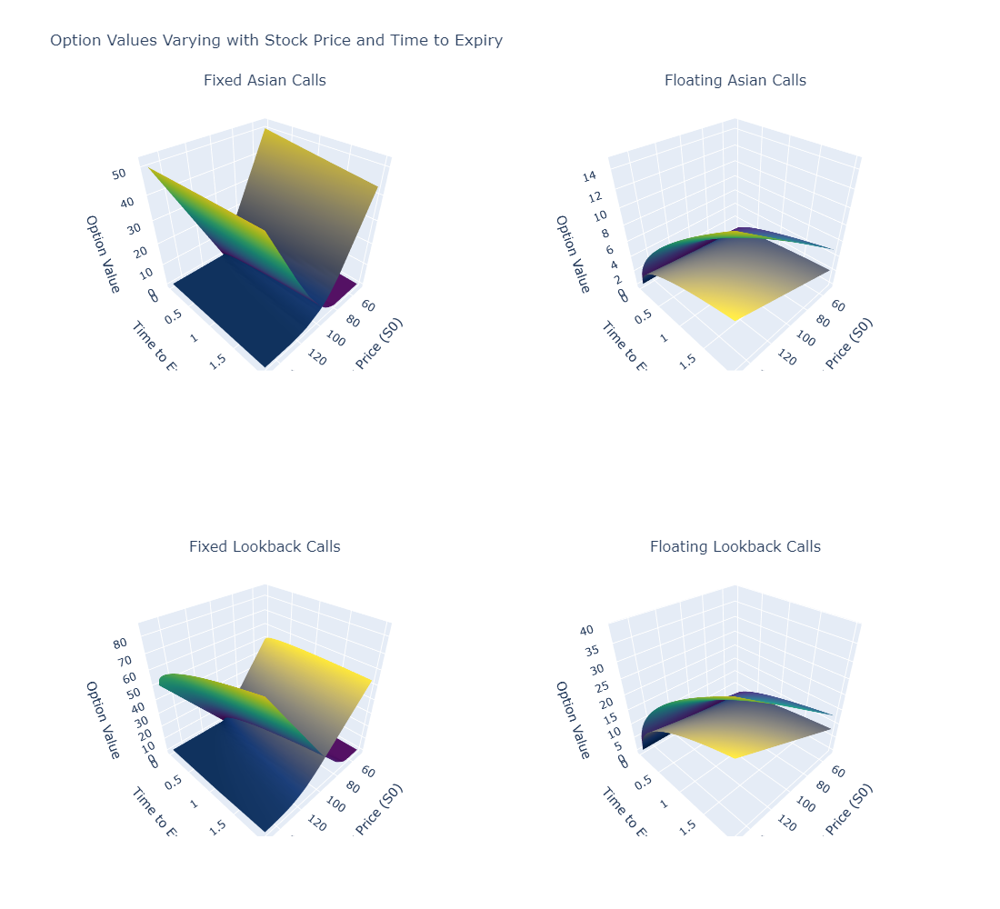

In [13]:
# Define ranges for S0 and sigma
S0_range = np.linspace(50, 150, 50)  # Initial stock prices from $50 to $150
dte_range = np.linspace(0, 2, 50)  # from 0DTE to 2 years maturity

# Create a grid of S0 and sigma values
S0_grid, dte_grid = np.meshgrid(S0_range, dte_range)

# Constant parameters
nsims = 10
rate = 0.05
sigma = 0.2

# Initialize result matrices for the four option types
fixed_asian_calls = np.zeros_like(S0_grid)
floating_asian_calls = np.zeros_like(S0_grid)
fixed_lookback_calls = np.zeros_like(S0_grid)
floating_lookback_calls = np.zeros_like(S0_grid)
fixed_asian_puts = np.zeros_like(S0_grid)
floating_asian_puts = np.zeros_like(S0_grid)
fixed_lookback_puts = np.zeros_like(S0_grid)
floating_lookback_puts = np.zeros_like(S0_grid)

# Calculate option prices for each (S0, sigma) pair
for i in range(len(S0_range)):
    for j in range(len(dte_range)):
        mc = MonteCarloOptionPricing(S0_grid[j, i], 100, rate, sigma, dte_grid[j, i], nsims)
        fixed_asian_calls[j, i], fixed_asian_puts[j, i] = mc.asian_option('Fixed')
        floating_asian_calls[j, i], floating_asian_puts[j, i] = mc.asian_option('Floating')
        fixed_lookback_calls[j, i], fixed_lookback_puts[j, i] = mc.lookback_option('Fixed')
        floating_lookback_calls[j, i], floating_lookback_puts[j, i] = mc.lookback_option('Floating')

# Plotting
fig = make_subplots(rows=2, cols=2, specs=[[{'type': 'surface'}, {'type': 'surface'}], [{'type': 'surface'}, {'type': 'surface'}]],
                    subplot_titles=("Fixed Asian Calls", "Floating Asian Calls", "Fixed Lookback Calls", "Floating Lookback Calls"))

# Add surface plots for each option type
fig.add_trace(go.Surface(x=S0_range, y=dte_range, z=fixed_asian_calls, colorscale='Viridis', name='Calls', colorbar=None, showscale=False), 1, 1)
fig.add_trace(go.Surface(x=S0_range, y=dte_range, z=fixed_asian_puts, colorscale='Cividis', name='Puts', colorbar=None, showscale=False), 1, 1)
fig.add_trace(go.Surface(x=S0_range, y=dte_range, z=floating_asian_calls, colorscale='Viridis', name='Calls', colorbar=None, showscale=False), 1, 2)
fig.add_trace(go.Surface(x=S0_range, y=dte_range, z=floating_asian_puts, colorscale='Cividis', name='Puts', colorbar=None, showscale=False), 1, 2)
fig.add_trace(go.Surface(x=S0_range, y=dte_range, z=fixed_lookback_calls, colorscale='Viridis', name='Calls', colorbar=None, showscale=False), 2, 1)
fig.add_trace(go.Surface(x=S0_range, y=dte_range, z=fixed_lookback_puts, colorscale='Cividis', name='Puts', colorbar=None, showscale=False), 2, 1)
fig.add_trace(go.Surface(x=S0_range, y=dte_range, z=floating_lookback_calls, colorscale='Viridis', name='Calls', colorbar=None, showscale=False), 2, 2)
fig.add_trace(go.Surface(x=S0_range, y=dte_range, z=floating_lookback_puts, colorscale='Cividis', name='Puts', colorbar=None, showscale=False), 2, 2)

# Update layout
fig.update_layout(title="Option Values Varying with Stock Price and Time to Expiry",
                  scene=dict(
                      xaxis_title="Stock Price (S0)",
                      yaxis_title="Time to Expiry",
                      zaxis_title="Option Value"),
                  scene2=dict(
                      xaxis_title="Stock Price (S0)",
                      yaxis_title="Time to Expiry",
                      zaxis_title="Option Value"),
                  scene3=dict(
                      xaxis_title="Stock Price (S0)",
                      yaxis_title="Time to Expiry",
                      zaxis_title="Option Value"),
                  scene4=dict(
                      xaxis_title="Stock Price (S0)",
                      yaxis_title="Time to Expiry",
                      zaxis_title="Option Value"),
                  height=1000, width=1000)

# Show plot
fig.show()

##### Comments:

- Fixed asian and lookback call (put) options are cheapest (expensive) when $(T-t)$ is low (high) and $S_T$ is high (low) and vice-versa
- Floating asian and lookback call and put options are cheapest when $(T-t)$ is low and $S_T$ is high and vice-versa or if $(T-t)$ is sufficinetly low.

##### Option Value w.r.t. Volatility and Time to Expiry

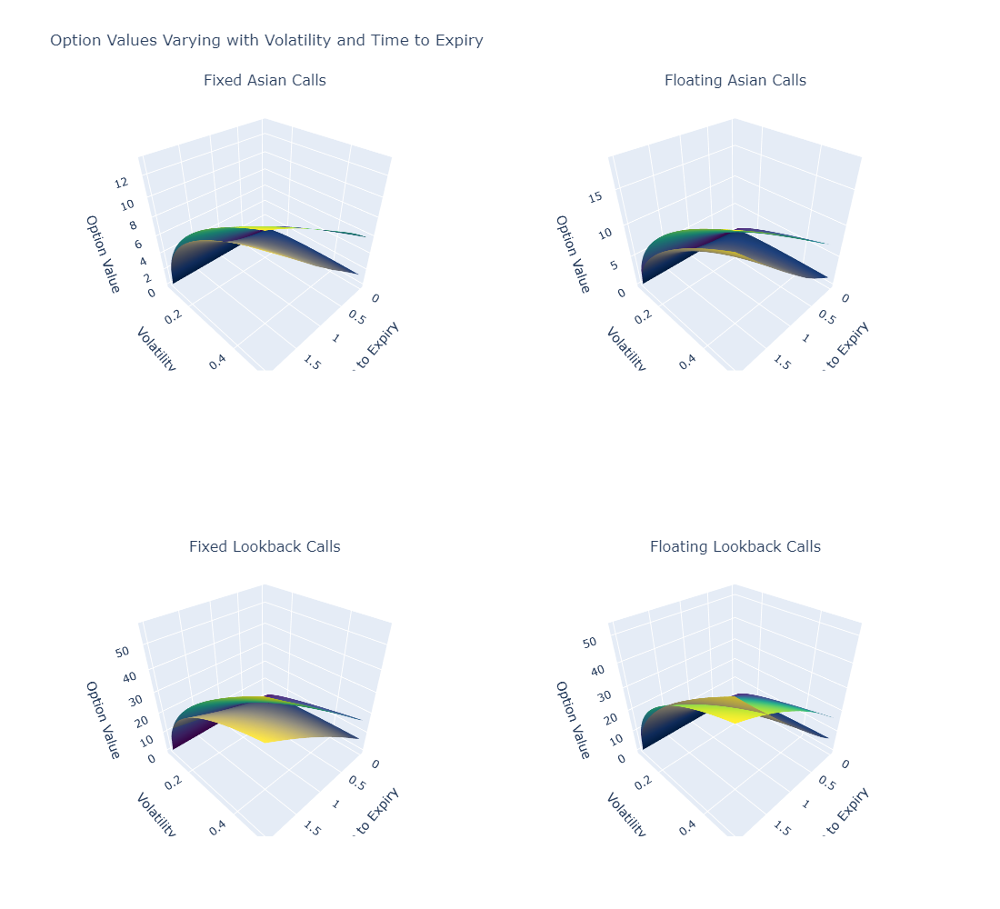

In [14]:
# Define ranges for S0 and sigma
sigma_range = np.linspace(0.1, 0.5, 50)  # Volatility from 10% to 50%
dte_range = np.linspace(0, 2, 50)  # from 0DTE to 2 years maturity

# Create a grid of S0 and sigma values
sigma_grid, dte_grid = np.meshgrid(sigma_range, dte_range)

# Constant parameters
nsims = 10
rate = 0.05
S0 = 100

# Initialize result matrices for the four option types
fixed_asian_calls = np.zeros_like(sigma_grid)
floating_asian_calls = np.zeros_like(sigma_grid)
fixed_lookback_calls = np.zeros_like(sigma_grid)
floating_lookback_calls = np.zeros_like(sigma_grid)
fixed_asian_puts = np.zeros_like(sigma_grid)
floating_asian_puts = np.zeros_like(sigma_grid)
fixed_lookback_puts = np.zeros_like(sigma_grid)
floating_lookback_puts = np.zeros_like(sigma_grid)

# Calculate option prices for each (S0, sigma) pair
for i in range(len(sigma_grid)):
    for j in range(len(dte_range)):
        mc = MonteCarloOptionPricing(S0, 100, rate, sigma_grid[j, i], dte_grid[j, i], nsims)
        fixed_asian_calls[j, i], fixed_asian_puts[j, i] = mc.asian_option('Fixed')
        floating_asian_calls[j, i], floating_asian_puts[j, i] = mc.asian_option('Floating')
        fixed_lookback_calls[j, i], fixed_lookback_puts[j, i] = mc.lookback_option('Fixed')
        floating_lookback_calls[j, i], floating_lookback_puts[j, i] = mc.lookback_option('Floating')

# Plotting
fig = make_subplots(rows=2, cols=2, specs=[[{'type': 'surface'}, {'type': 'surface'}], [{'type': 'surface'}, {'type': 'surface'}]],
                    subplot_titles=("Fixed Asian Calls", "Floating Asian Calls", "Fixed Lookback Calls", "Floating Lookback Calls"))

# Add surface plots for each option type
fig.add_trace(go.Surface(x=dte_range, y=sigma_range, z=fixed_asian_calls, colorscale='Viridis', name='Calls', colorbar=None, showscale=False), 1, 1)
fig.add_trace(go.Surface(x=dte_range, y=sigma_range, z=fixed_asian_puts, colorscale='Cividis', name='Puts', colorbar=None, showscale=False), 1, 1)
fig.add_trace(go.Surface(x=dte_range, y=sigma_range, z=floating_asian_calls, colorscale='Viridis', name='Calls', colorbar=None, showscale=False), 1, 2)
fig.add_trace(go.Surface(x=dte_range, y=sigma_range, z=floating_asian_puts, colorscale='Cividis', name='Puts', colorbar=None, showscale=False), 1, 2)
fig.add_trace(go.Surface(x=dte_range, y=sigma_range, z=fixed_lookback_calls, colorscale='Viridis', name='Calls', colorbar=None, showscale=False), 2, 1)
fig.add_trace(go.Surface(x=dte_range, y=sigma_range, z=fixed_lookback_puts, colorscale='Cividis', name='Puts', colorbar=None, showscale=False), 2, 1)
fig.add_trace(go.Surface(x=dte_range, y=sigma_range, z=floating_lookback_calls, colorscale='Viridis', name='Calls', colorbar=None, showscale=False), 2, 2)
fig.add_trace(go.Surface(x=dte_range, y=sigma_range, z=floating_lookback_puts, colorscale='Cividis', name='Puts', colorbar=None, showscale=False), 2, 2)

# Update layout
fig.update_layout(title="Option Values Varying with Volatility and Time to Expiry",
                  scene=dict(
                      xaxis_title="Time to Expiry",
                      yaxis_title="Volatility (σ)",
                      zaxis_title="Option Value"),
                  scene2=dict(
                      xaxis_title="Time to Expiry",
                      yaxis_title="Volatility (σ)",
                      zaxis_title="Option Value"),
                  scene3=dict(
                      xaxis_title="Time to Expiry",
                      yaxis_title="Volatility (σ)",
                      zaxis_title="Option Value"),
                  scene4=dict(
                      xaxis_title="Time to Expiry",
                      yaxis_title="Volatility (σ)",
                      zaxis_title="Option Value"),
                  height=1000, width=1000)

# Show plot
fig.show()

##### Comments:

- Fixed and floating asian and lookback call and put options are cheapest when $(T-t)$ and $\sigma$ are low and vice-versa
- Floating lookback options intercept when $\sigma$ and $(T-t)$ are sufficiently high or if $(T-t)$ is sufficiently low.

##### Option Value w.r.t. Volatility and Risk-Free Rate

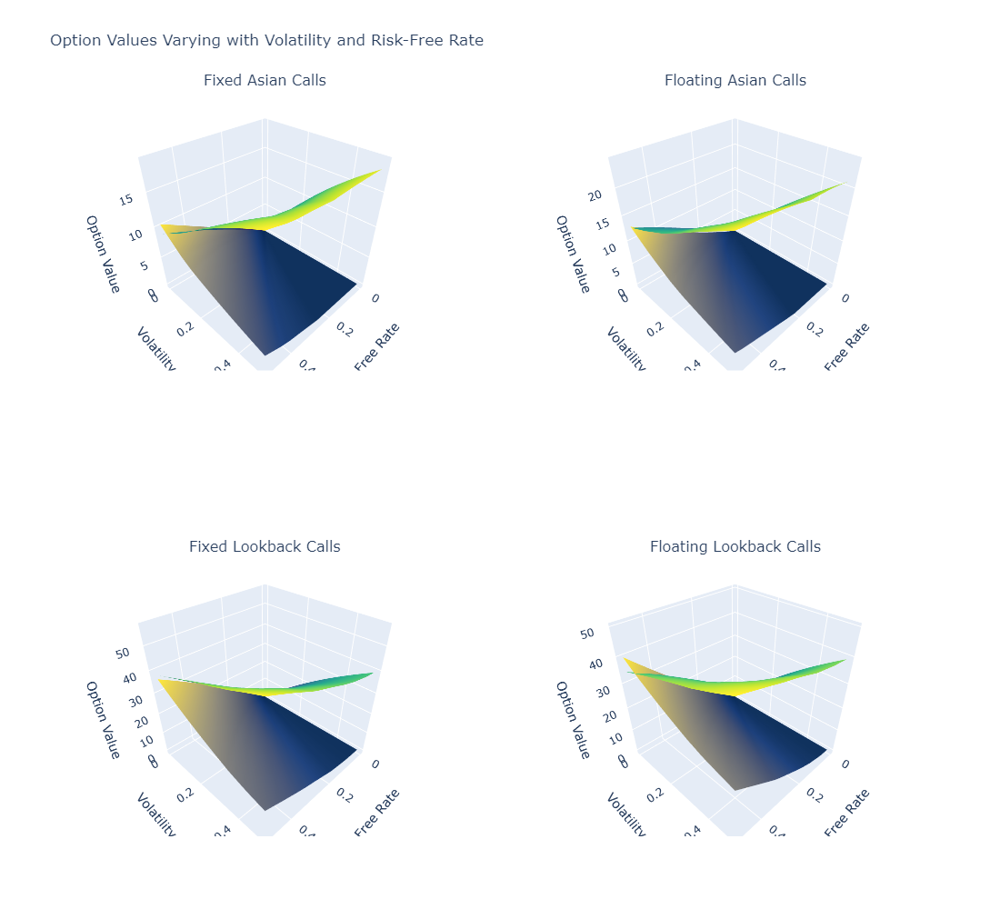

In [15]:
# Define ranges for S0 and sigma
sigma_range = np.linspace(0, 0.5, 50)  # Volatility from 0% to 50%
rate_range = np.linspace(0, 0.5, 50)  # from 0% to 50% interest rates

# Create a grid of S0 and sigma values
sigma_grid, rate_grid = np.meshgrid(sigma_range, rate_range)

# Constant parameters
nsims = 10
dte = 1
S0 = 100

# Initialize result matrices for the four option types
fixed_asian_calls = np.zeros_like(sigma_grid)
floating_asian_calls = np.zeros_like(sigma_grid)
fixed_lookback_calls = np.zeros_like(sigma_grid)
floating_lookback_calls = np.zeros_like(sigma_grid)
fixed_asian_puts = np.zeros_like(sigma_grid)
floating_asian_puts = np.zeros_like(sigma_grid)
fixed_lookback_puts = np.zeros_like(sigma_grid)
floating_lookback_puts = np.zeros_like(sigma_grid)

# Calculate option prices for each (S0, sigma) pair
for i in range(len(sigma_grid)):
    for j in range(len(dte_range)):
        mc = MonteCarloOptionPricing(S0, 100, rate_grid[j, i], sigma_grid[j, i], dte, nsims)
        fixed_asian_calls[j, i], fixed_asian_puts[j, i] = mc.asian_option('Fixed')
        floating_asian_calls[j, i], floating_asian_puts[j, i] = mc.asian_option('Floating')
        fixed_lookback_calls[j, i], fixed_lookback_puts[j, i] = mc.lookback_option('Fixed')
        floating_lookback_calls[j, i], floating_lookback_puts[j, i] = mc.lookback_option('Floating')

# Plotting
fig = make_subplots(rows=2, cols=2, specs=[[{'type': 'surface'}, {'type': 'surface'}], [{'type': 'surface'}, {'type': 'surface'}]],
                    subplot_titles=("Fixed Asian Calls", "Floating Asian Calls", "Fixed Lookback Calls", "Floating Lookback Calls"))

# Add surface plots for each option type
fig.add_trace(go.Surface(x=rate_range, y=sigma_range, z=fixed_asian_calls, colorscale='Viridis', name='Calls', colorbar=None, showscale=False), 1, 1)
fig.add_trace(go.Surface(x=rate_range, y=sigma_range, z=fixed_asian_puts, colorscale='Cividis', name='Puts', colorbar=None, showscale=False), 1, 1)
fig.add_trace(go.Surface(x=rate_range, y=sigma_range, z=floating_asian_calls, colorscale='Viridis', name='Calls', colorbar=None, showscale=False), 1, 2)
fig.add_trace(go.Surface(x=rate_range, y=sigma_range, z=floating_asian_puts, colorscale='Cividis', name='Puts', colorbar=None, showscale=False), 1, 2)
fig.add_trace(go.Surface(x=rate_range, y=sigma_range, z=fixed_lookback_calls, colorscale='Viridis', name='Calls', colorbar=None, showscale=False), 2, 1)
fig.add_trace(go.Surface(x=rate_range, y=sigma_range, z=fixed_lookback_puts, colorscale='Cividis', name='Puts', colorbar=None, showscale=False), 2, 1)
fig.add_trace(go.Surface(x=rate_range, y=sigma_range, z=floating_lookback_calls, colorscale='Viridis', name='Calls', colorbar=None, showscale=False), 2, 2)
fig.add_trace(go.Surface(x=rate_range, y=sigma_range, z=floating_lookback_puts, colorscale='Cividis', name='Puts', colorbar=None, showscale=False), 2, 2)

# Update layout
fig.update_layout(title="Option Values Varying with Volatility and Risk-Free Rate",
                  scene=dict(
                      xaxis_title="Risk-Free Rate",
                      yaxis_title="Volatility (σ)",
                      zaxis_title="Option Value"),
                  scene2=dict(
                      xaxis_title="Risk-Free Rate",
                      yaxis_title="Volatility (σ)",
                      zaxis_title="Option Value"),
                  scene3=dict(
                      xaxis_title="Risk-Free Rate",
                      yaxis_title="Volatility (σ)",
                      zaxis_title="Option Value"),
                  scene4=dict(
                      xaxis_title="Risk-Free Rate",
                      yaxis_title="Volatility (σ)",
                      zaxis_title="Option Value"),
                  height=1000, width=1000)

# Show plot
fig.show()

##### Comments:

- Fixed asian and lookback call (put) options are cheapest (expensive) when $r$ is low (high) and $\sigma$ is high and vice-versa
- Fixed and floating lookback options intercept when $(T-t)$ is sufficiently low.

## Conclusion

In this assignment, I performed the valuation of asian and lookback options with various payoff structures via Monte Carlo method using the Euler–Maruyama scheme to simulate the underlying stock price. Leveraging Monte Carlo methods has some drawbacks as, for instance, it requires quite a lot computational power which can be address with some variance reduction techniques. Furthermore, any Monte Carlo methods itself possesses a compuational error, which comes from two sources (the granularity of the time-step and the number of simulations). 

There is more room for further research. For example, comparing the simulated lookback option prices with their closed form solutions. There is also a vast amount of lookback option types that were not studied such as partial-time fixed (floating) lookbacks and (reverse) extreme spread options. Additionally, using finite difference methods one could estimate the options' greeks which could then lead to further risk and sensitivity analysis. Lastly, the Monte Carlo simulaton assumed constant volatility and risk-free rates throughout the course of the underlying asset's price path, which empirically are not true. This paves the way for introducing stochastic interest rate models such as Vasicek (1977) or CIR (1985) and stochatic volatility models such as Heston (1993) to enhance the simulation of the price paths more close to the real-world.

### References

- The Brownian Movement by Feynman, R. (1964) in “The Feynman Lectures of Physics”, Volume I.

- Brownian Motion and Stochastic Calculus by Ioannis Karatzas, and Steven E. Shreve (1998), Springer.

- Brownian Motion Notes by Peter Morters and Yuval Peres (2008).

- The Zero Set and Arcsine Laws of Brownian Motion by Lecturer: Manjunath Krishnapur.

- Monte Carlo methods in finance by Peter Jackel.

- Paul Wilmott on Quantitative Finance by Paul Wilmott, Volume 1 and Volume 2, Wiley.

- Options, Futures and Other Derivatives by John Hull, Pearson.

- The Complete Guide to Option Pricing Formulas by Espen Huag.